In [6]:
import matplotlib.pyplot as plt
import canonical_computations_package as CC
import itertools
import numpy as np
from dask.distributed import Client


In [21]:
def pipeline(rule, CA_size, T, input_example_size, locations, CC_labels = None):
    """
    Pipeline functions used for parallelization. 
    This pipeline produces a CC diagram for given rule, CA size, CA run time and encoding locations.
    Note that if CA_size = input_example_size (n = k in paper) and locations equals range(CA_size)
    the full set of possible initial configurations will be produced. Thus this is equivalent to
    not using an encoder
    """

    # Input set = {0,1}^2
    input_set = np.array([list(input_example) for input_example in itertools.product(
        [0, 1], repeat=input_example_size)])

    encoded_input_set = CC.ReCA.spatial_encoders.k_to_n_encoder(
        input_set=input_set,
        encoded_input_size=CA_size,
        locations=locations
    )

    space_time_diagrams = []

    for i in range(encoded_input_set.shape[0]):
        initial_configuration = encoded_input_set[i, :]
        space_time_diagrams.append(
            CC.CA.ECA.run_ECA(rule, initial_configuration, T))

    space_time_diagrams = np.array(space_time_diagrams)

    if CC_labels == None:
        CC_diagram, numeric_label_to_function_dict = CC.diagrams.CC_diagram(space_time_diagrams)
        return CC_diagram, numeric_label_to_function_dict

    else:
        CC_diagram = CC.diagrams.CC_diagram_consistent_labels(space_time_diagrams, CC_labels)
        return CC_diagram


In [13]:
import time


In [22]:
# Speed test: n_workers = 1
# May be best if shared memory is needed as workers don't share memory

input_example_size = 5
locations = [0, 2, 4, 6, 8]
CA_size = 20
T = 200

times = []
with Client(n_workers=1) as client:
    for r in range(10):
        t0 = time.time()
        futures = []

        for rule in range(0, 256):
            future = client.submit(
                pipeline, rule, CA_size, T, input_example_size, locations)
            futures.append(future)

        CC_diagrams = client.gather(futures)
        times.append(time.time()-t0)

print(np.mean(np.array(times)))


4.509149885177612


In [23]:
# Speed test: n_workers = n_cores
# Should be fastest if pipeline has a lot of python code and takes more time than around 100 ms

input_example_size = 5
locations = [0, 2, 4, 6, 8]
CA_size = 20
T = 200

times = []
with Client(n_workers=64) as client:
    for r in range(10):
        t0 = time.time()
        futures = []

        for rule in range(0, 256):
            future = client.submit(
                pipeline, rule, CA_size, T, input_example_size, locations)
            futures.append(future)

        CC_diagrams = client.gather(futures)
        times.append(time.time()-t0)

print(np.mean(np.array(times)))


1.1931364774703979


In [24]:
# Speed test: No parallelization
input_example_size = 5
locations = [0, 2, 4, 6, 8]
CA_size = 20
T = 200

futures = []

times = []
for r in range(10):
    t0 = time.time()
    for rule in range(0, 256):

        future = pipeline(rule, CA_size, T, input_example_size, locations)
        futures.append(future)
    times.append(time.time()-t0)
print(np.mean(np.array(times)))


3.78131103515625


In [28]:
input_example_size = 5
locations = [0, 2, 4, 6, 8]
CA_size = 20
T = 2000

# Note: Set n_workers = the number of cores on your CPU
with Client(n_workers=64) as client:

    futures = []

    for rule in range(0, 256):
        future = client.submit(pipeline, rule, CA_size,
                               T, input_example_size, locations)
        futures.append(future)

    CC_diagrams = client.gather(futures)


3.78131103515625


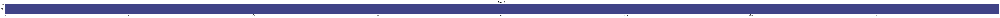

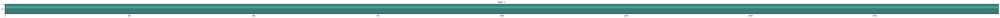

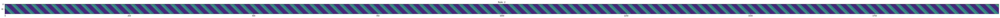

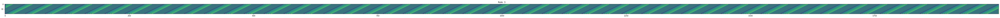

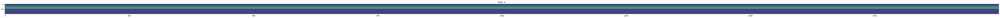

...

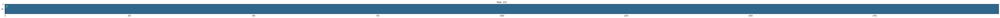

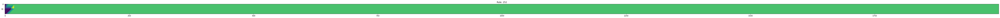

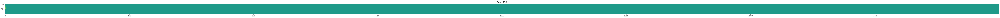

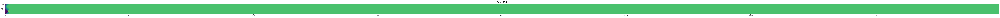

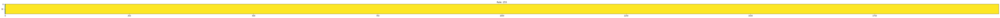

In [31]:
figsize = (100, 400)

for i in range(len(CC_diagrams)):
    plt.figure(figsize=figsize)
    plt.title("Rule: " + str(i))
    plt.imshow(CC_diagrams[i])
    plt.show()
